## Test Model 2030

In [24]:
import pypsa 
import matplotlib.pyplot as plt
plt.style.use("bmh")
import pandas as pd
from pypsa.plot import add_legend_patches
import gurobipy
import cartopy.crs as ccrs

pd.set_option("display.max_rows", None)  # Display all rows
pd.set_option("display.max_columns", None)  # Display all columns


## Import Network

In [4]:
n = pypsa.Network("C:\\Users\\Jeremy\\Documents\\MasterThesis\\Models\\20240309\\elec_s_37_ec_lv1.5_Co2L-3h.nc")


INFO:pypsa.io:Imported network elec_s_37_ec_lv1.5_Co2L-3h.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [20]:
for c in n.iterate_components(list(n.components.keys())[2:]):
    print("Component '{}' has {} entries".format(c.name,len(c.df)))

Component 'Bus' has 111 entries
Component 'Carrier' has 24 entries
Component 'GlobalConstraint' has 2 entries
Component 'Line' has 52 entries
Component 'LineType' has 34 entries
Component 'TransformerType' has 14 entries
Component 'Link' has 191 entries
Component 'Load' has 37 entries
Component 'Generator' has 449 entries
Component 'StorageUnit' has 50 entries
Component 'Store' has 74 entries


In [25]:
n.lines.head()

,bus0,bus1,v_nom,num_parallel,length,carrier,type,s_max_pu,s_nom,capital_cost,i_nom,s_nom_extendable,s_nom_min,s_nom_max,x,r,b,build_year,x_pu_eff,r_pu_eff,s_nom_opt,g,s_nom_mod,lifetime,terrain_factor,v_ang_min,v_ang_max,sub_network,x_pu,r_pu,g_pu,b_pu
Line,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,AL1 0,GR1 0,380.0,1.000000,474.029281,AC,Al/St 240/40 4-bundle 380.0,0.7,1698.102612,19962.597535,2.58,True,1698.102612,21698.102612,116.611203,14.220878,0.002055,0,0.000808,0.000098,1.000000e+10,0.0,0.0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0
1,AL1 0,ME1 0,380.0,1.289474,186.359938,AC,Al/St 240/40 4-bundle 380.0,0.7,2189.658631,7847.313221,2.58,True,2189.658631,22189.658631,35.552912,4.335721,0.001042,0,0.000246,0.000030,1.000000e+10,0.0,0.0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0
10,BA1 0,HR1 0,380.0,3.157895,274.875740,AC,Al/St 240/40 4-bundle 380.0,0.7,5362.429300,11572.530986,2.58,True,5362.429300,25362.429300,21.412820,2.611320,0.003763,0,0.000148,0.000018,1.000001e+10,0.0,0.0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0
11,BA1 0,ME1 0,380.0,1.578947,173.725327,AC,Al/St 240/40 4-bundle 380.0,0.7,2681.214650,7316.538731,2.58,True,2681.214650,22681.214650,27.066406,3.300781,0.001189,0,0.000187,0.000023,1.000000e+10,0.0,0.0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0
12,BA1 0,RS1 0,380.0,1.289474,257.557936,AC,Al/St 240/40 4-bundle 380.0,0.7,2189.658631,10843.598752,2.58,True,2189.658631,22189.658631,49.135747,5.992164,0.001440,0,0.000340,0.000041,1.000000e+10,0.0,0.0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0


## Plot Network

<function matplotlib.pyplot.show(close=None, block=None)>

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


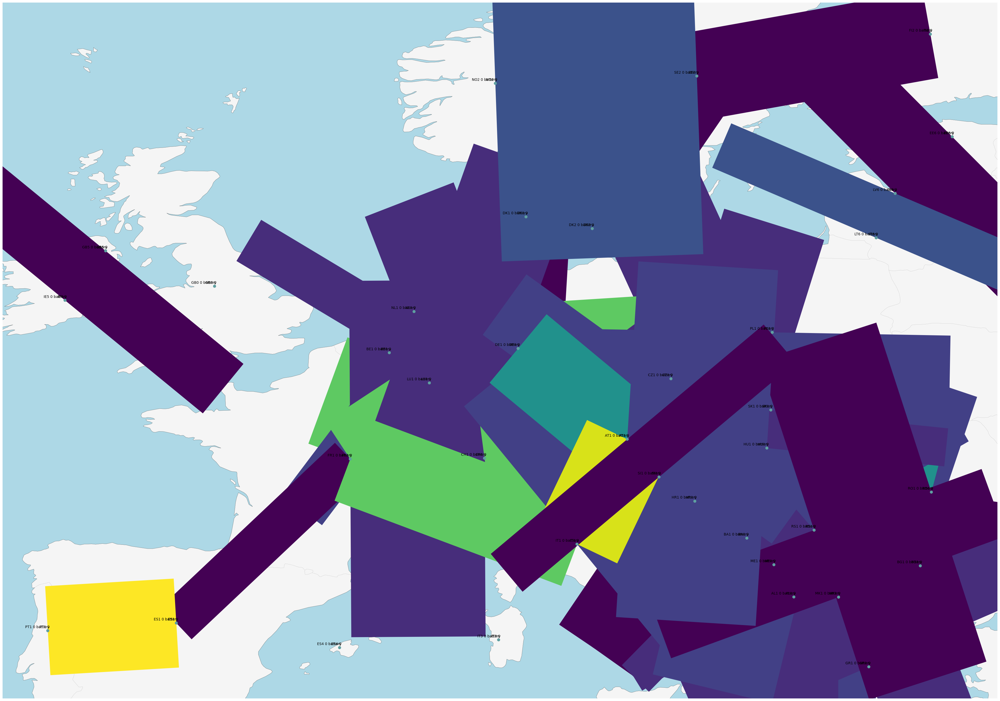

In [18]:
loading = (n.lines_t.p0.abs().mean().sort_index()/(n.lines.s_nom_opt*n.lines.s_max_pu).sort_index()).fillna(0.)

fig, ax = plt.subplots(
    figsize=(50,50),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

n.plot(
    ax=ax,
    branch_components=["Line"],
    line_widths=n.lines.s_nom_opt/1e7, #GW
    line_colors=loading,
    line_cmap=plt.cm.viridis,
    color_geomap=True,
    bus_sizes=0.003
)

bus = n.buses
region = []
for index, row in bus.iterrows():
    x = row['x']
    y = row['y']
    if "H2" in index:
        pass
    else:
        region.append(index)
        ax.annotate(
        index,
        xy=(x, y),
        xytext=(5, 5),  # Adjust the position of the annotation
        textcoords="offset points",
        ha='right', va='bottom'
    )

plt.show





In [37]:
def inst_cap_plot():

    capacities = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()

    plt.rcParams.update({'font.size': 16})

    fig = plt.figure(figsize=(50,50))
    ax = plt.axes(projection=ccrs.PlateCarree())

    n.plot(
        ax=ax,
        margin=0.3,
        bus_sizes= capacities / 1e11,
        title=f"Installed power capacities"
    )

    add_legend_patches(
        ax,
        n.carriers.color,
        n.carriers.index,
        legend_kw=dict(frameon=False, bbox_to_anchor=(0,1))
    )

    return capacities

ValueError: Invalid RGBA argument: ''

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


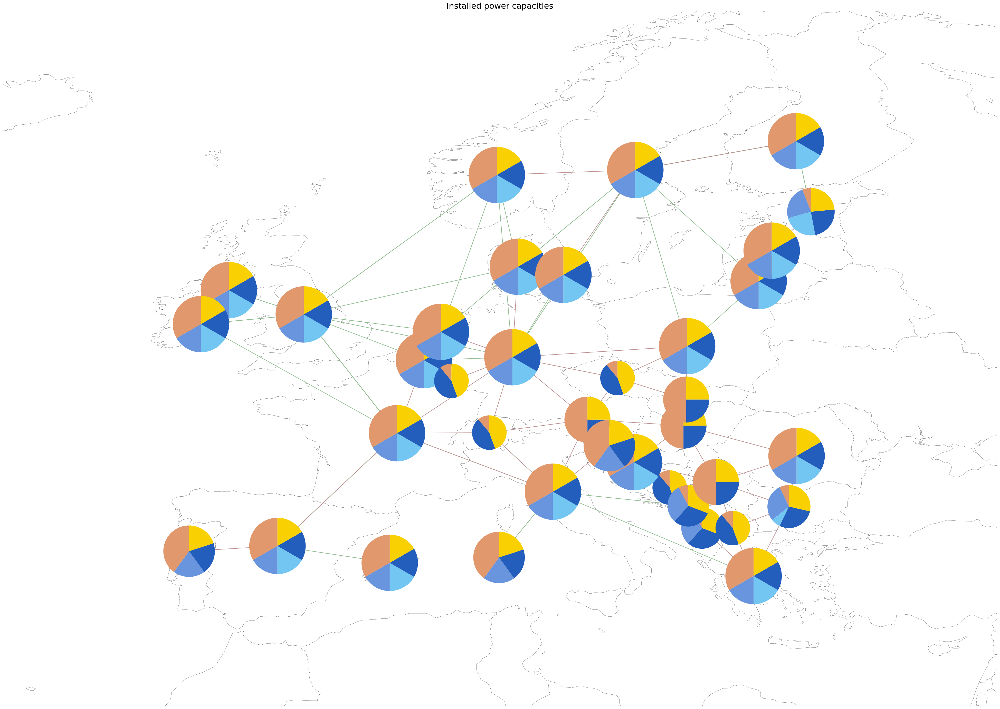

In [38]:
inst_cap_plot()

In [39]:
gen = n.generators
carrier = gen.carrier.unique()
def gen_power_table(colors):

    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                except KeyError:
                    print('error')

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    (generations.unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=colors,
                                grid=True,
                                xlabel="",
                                ylabel="Generated electricity [GWh]",
                                #title=f"Generated electricity in Italy in {year}"
    )

    plt.show()

<Figure size 640x480 with 0 Axes>

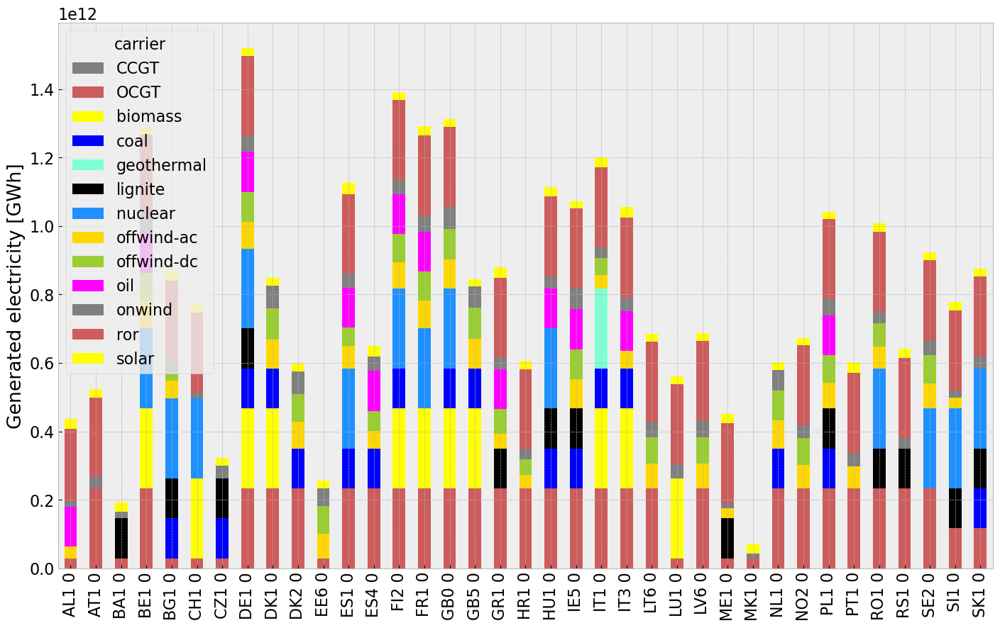

In [40]:
colors = ["grey", "indianred", "yellow", "blue", "aquamarine", "black", "dodgerblue", "gold", "yellowgreen", "magenta"]
gen_power_table(colors)

In [41]:
def inst_cap_table(colors):

    capacities = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
    capacities.fillna(0, inplace=True)

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    (capacities.unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=colors,
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed power capacity"
    )

    plt.show()

<Figure size 640x480 with 0 Axes>

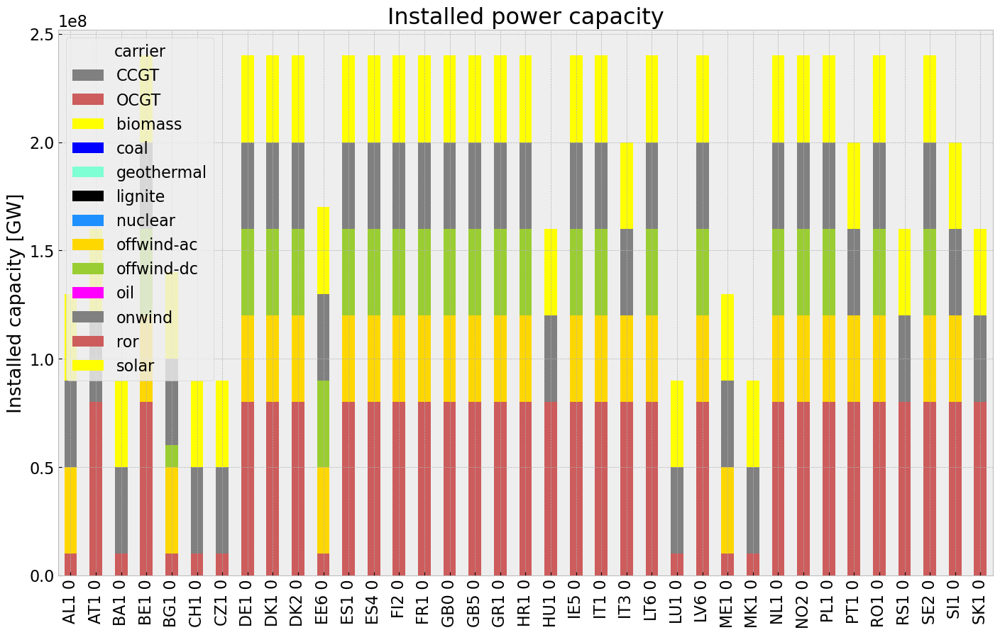

In [43]:
inst_cap_table(colors)

In [75]:
def gen_curve_month_summer(colors):

    plt.rcParams.update({'font.size': 16})

    time="2013-03"

    p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
    
    if not n.storage_units.empty:
        sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
        p_by_carrier = pd.concat([p_by_carrier, sto], axis=1)
    
    fig, ax = plt.subplots(figsize=(14, 10))
        
    p_by_carrier.where(p_by_carrier>0).loc[time].plot.area(
        ax=ax,
        linewidth=0,
        color=colors,
        grid=True,

    )
    
    charge = p_by_carrier.where(p_by_carrier<0).dropna(how='all', axis=1).loc[time]
    
    if not charge.empty:

        charge.plot.area(
            ax=ax,
            linewidth=0,
            color=["yellowgreen", "magenta"],
            grid=True,
        )
    
    n.loads_t.p_set.sum(axis=1).loc[time].div(1e3).plot(ax=ax, c='k',grid=True)

    plt.legend(loc=(1.05,0))
    
    ax.set_ylabel("Power []")
    ax.set_title(f"Hourly electricity production")


    ax.set_ylim(-20, 2e10)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10208\1942500173.py:7: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_10208\1942500173.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)


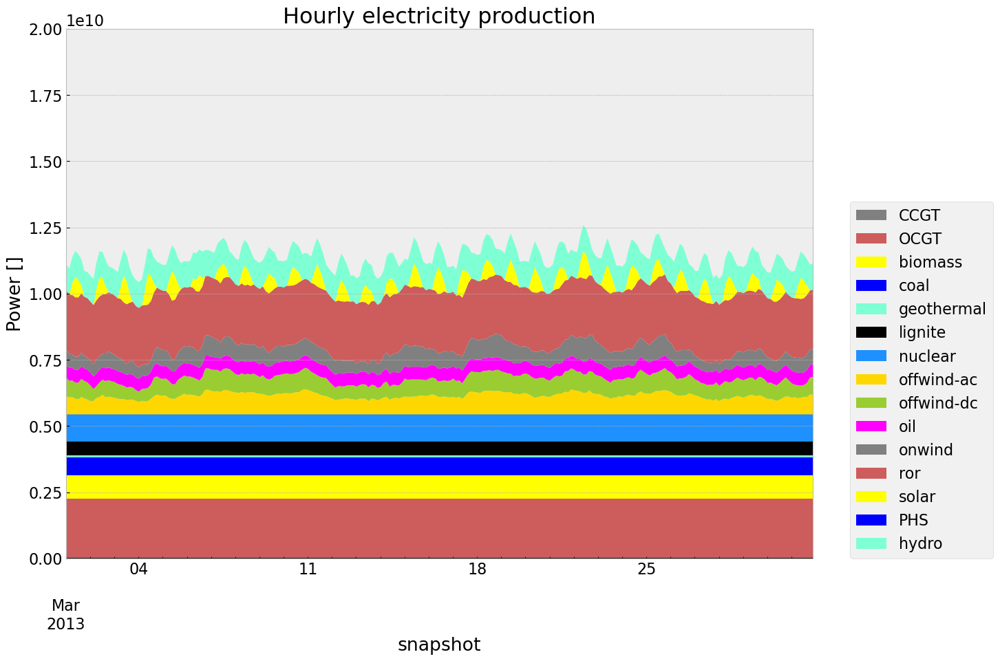

In [74]:
gen_curve_month_summer(colors)

<Axes: xlabel='snapshot', ylabel='MW'>

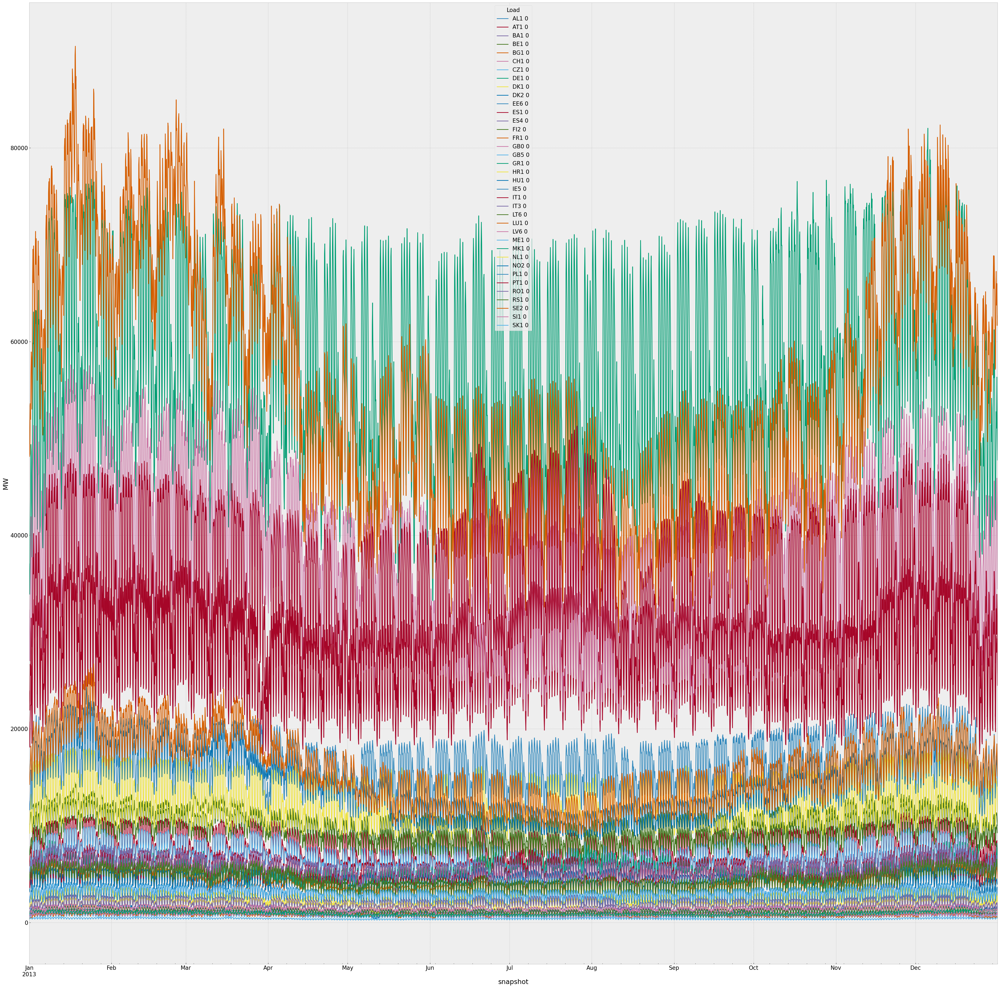

In [81]:
n.loads_t.p_set.plot(figsize=(50,50), ylabel="MW")

,v_nom,x,y,country,control,generator,carrier,location,type,unit,v_mag_pu_set,v_mag_pu_min,v_mag_pu_max,sub_network
Bus,,,,,,,,,,,,,,
AL1 0,380.0,19.897914,41.587568,AL,Slack,AL1 0 CCGT,AC,,,,1.0,0.0,inf,
AT1 0,380.0,13.604274,47.549498,AT,PQ,,AC,,,,1.0,0.0,inf,
BA1 0,380.0,18.122704,43.811367,BA,PQ,,AC,,,,1.0,0.0,inf,
BE1 0,380.0,4.617461,50.818887,BE,PQ,,AC,,,,1.0,0.0,inf,
BG1 0,380.0,24.673671,42.765271,BG,PQ,,AC,,,,1.0,0.0,inf,
CH1 0,380.0,8.213076,46.832432,CH,PQ,,AC,,,,1.0,0.0,inf,
CZ1 0,380.0,15.255766,49.835025,CZ,PQ,,AC,,,,1.0,0.0,inf,
DE1 0,380.0,9.482007,50.978098,DE,PQ,,AC,,,,1.0,0.0,inf,
DK1 0,380.0,9.780572,55.954011,DK,PQ,,AC,,,,1.0,0.0,inf,
